# Soft Actor Critic for Minitaur Environment using TF-Agents
Reference: https://www.tensorflow.org/agents/tutorials/7_SAC_minitaur_tutorial

In [1]:
# Bit of formatting because inline code is not styled very good by default:
from IPython.core.display import HTML
HTML("""<style> .rendered_html code { 
    padding: 2px 4px;
    color: #c7254e;
    background-color: #f9f2f4;
    border-radius: 4px;
} </style>""")

In [2]:
# Get necessary libraries
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import base64
import imageio
import IPython
import matplotlib
import matplotlib.pyplot as plt
import PIL.Image

import tensorflow as tf
tf.compat.v1.enable_v2_behavior()

from tf_agents.agents.ddpg import critic_network
from tf_agents.agents.sac import sac_agent
from tf_agents.drivers import dynamic_step_driver
from tf_agents.environments import suite_pybullet
from tf_agents.environments import tf_py_environment
from tf_agents.eval import metric_utils
from tf_agents.metrics import tf_metrics
from tf_agents.networks import actor_distribution_network
from tf_agents.networks import normal_projection_network
from tf_agents.policies import greedy_policy
from tf_agents.policies import random_tf_policy
from tf_agents.replay_buffers import tf_uniform_replay_buffer
from tf_agents.trajectories import trajectory
from tf_agents.utils import common

## Step 1: Create Environment

In [3]:
env_name = "MinitaurBulletEnv-v0"
env = suite_pybullet.load(env_name)

env.reset()
#PIL.Image.fromarray(env.render())

print("Action space: ", env.action_space)
print("Observation space: ", env.observation_space)

current_dir=C:\Users\vtan25\Anaconda3\envs\RLv2\lib\site-packages\pybullet_envs\bullet
urdf_root=C:\Users\vtan25\Anaconda3\envs\RLv2\lib\site-packages\pybullet_data
Action space:  Box(8,)
Observation space:  Box(28,)


C:\Users\vtan25\Anaconda3\envs\RLv2\lib\site-packages\gym\logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


## Step 2: Convert Environment to Tensors

In [4]:
train_py_env = suite_pybullet.load(env_name)
eval_py_env = suite_pybullet.load(env_name)

train_env = tf_py_environment.TFPyEnvironment(train_py_env)
eval_env = tf_py_environment.TFPyEnvironment(eval_py_env)

urdf_root=C:\Users\vtan25\Anaconda3\envs\RLv2\lib\site-packages\pybullet_data
urdf_root=C:\Users\vtan25\Anaconda3\envs\RLv2\lib\site-packages\pybullet_data


## Step 3: Set Hyperparameters

In [5]:
num_iterations = 100000 

initial_collect_steps = 10000 
collect_steps_per_iteration = 1 
replay_buffer_capacity = 1000000 

batch_size = 256 

critic_learning_rate = 3e-4 
actor_learning_rate = 3e-4 
alpha_learning_rate = 3e-4 
target_update_tau = 0.005 
target_update_period = 1 
gamma = 0.99 
reward_scale_factor = 1.0 
gradient_clipping = None 

actor_fc_layer_params = (256, 256)
critic_joint_fc_layer_params = (256, 256)

log_interval = 5000 

num_eval_episodes = 30 
eval_interval = 10000 

## Step 4: Define SAC Network

In [6]:
observation_spec = train_env.observation_spec()
action_spec = train_env.action_spec()
critic_net = critic_network.CriticNetwork(
    (observation_spec, action_spec),
    observation_fc_layer_params=None,
    action_fc_layer_params=None,
    joint_fc_layer_params=critic_joint_fc_layer_params)

In [7]:
def normal_projection_net(action_spec,init_means_output_factor=0.1):
  return normal_projection_network.NormalProjectionNetwork(
      action_spec,
      mean_transform=None,
      state_dependent_std=True,
      init_means_output_factor=init_means_output_factor,
      std_transform=sac_agent.std_clip_transform,
      scale_distribution=True)

actor_net = actor_distribution_network.ActorDistributionNetwork(
    observation_spec,
    action_spec,
    fc_layer_params=actor_fc_layer_params,
    continuous_projection_net=normal_projection_net)

## Step 5: Initialize Agent

In [8]:
global_step = tf.compat.v1.train.get_or_create_global_step()
tf_agent = sac_agent.SacAgent(
    train_env.time_step_spec(),
    action_spec,
    actor_network=actor_net,
    critic_network=critic_net,
    actor_optimizer=tf.compat.v1.train.AdamOptimizer(
        learning_rate=actor_learning_rate),
    critic_optimizer=tf.compat.v1.train.AdamOptimizer(
        learning_rate=critic_learning_rate),
    alpha_optimizer=tf.compat.v1.train.AdamOptimizer(
        learning_rate=alpha_learning_rate),
    target_update_tau=target_update_tau,
    target_update_period=target_update_period,
    td_errors_loss_fn=tf.compat.v1.losses.mean_squared_error,
    gamma=gamma,
    reward_scale_factor=reward_scale_factor,
    gradient_clipping=gradient_clipping,
    train_step_counter=global_step)
tf_agent.initialize()

Instructions for updating:
`AffineScalar` bijector is deprecated; please use `tfb.Shift(loc)(tfb.Scale(...))` instead.


## Step 6: Policies
Agents contain two policies: the main policy (agent.policy) and the behavioral policy that is used for data collection (agent.collect_policy). For evaluation/deployment, we take the mean action by wrapping the main policy with GreedyPolicy().

In [9]:
eval_policy = greedy_policy.GreedyPolicy(tf_agent.policy)
collect_policy = tf_agent.collect_policy

random_policy = random_tf_policy.RandomTFPolicy(train_env.time_step_spec(),
                                                train_env.action_spec())

## Step 7: Metrics and Evaluation

In [10]:
def compute_avg_return(environment, policy, num_episodes=5):

  total_return = 0.0
  for _ in range(num_episodes):

    time_step = environment.reset()
    episode_return = 0.0

    while not time_step.is_last():
      action_step = policy.action(time_step)
      time_step = environment.step(action_step.action)
      episode_return += time_step.reward
    total_return += episode_return

  avg_return = total_return / num_episodes
  return avg_return.numpy()[0]


compute_avg_return(eval_env, eval_policy, num_eval_episodes)

-0.038722523

## Step 8: Replay Buffer

In [11]:
replay_buffer = tf_uniform_replay_buffer.TFUniformReplayBuffer(
    data_spec=tf_agent.collect_data_spec,
    batch_size=train_env.batch_size,
    max_length=replay_buffer_capacity)

## Step 9: Data Collection

In [12]:
initial_collect_driver = dynamic_step_driver.DynamicStepDriver(
        train_env,
        collect_policy,
        observers=[replay_buffer.add_batch],
        num_steps=initial_collect_steps)
initial_collect_driver.run()

# Dataset generates trajectories with shape [Bx2x...]
dataset = replay_buffer.as_dataset(
    num_parallel_calls=3, sample_batch_size=batch_size, num_steps=2).prefetch(3)

iterator = iter(dataset)

Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.while_loop(c, b, vars, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.while_loop(c, b, vars))


## Step 10: Train Agent

In [13]:
collect_driver = dynamic_step_driver.DynamicStepDriver(
    train_env,
    collect_policy,
    observers=[replay_buffer.add_batch],
    num_steps=collect_steps_per_iteration)

# (Optional) Optimize by wrapping some of the code in a graph using TF function.
tf_agent.train = common.function(tf_agent.train)
collect_driver.run = common.function(collect_driver.run)

# Reset the train step
tf_agent.train_step_counter.assign(0)

# Evaluate the agent's policy once before training.
avg_return = compute_avg_return(eval_env, eval_policy, num_eval_episodes)
returns = [avg_return]

for _ in range(num_iterations):

  # Collect a few steps using collect_policy and save to the replay buffer.
  collect_driver.run()

  # Sample a batch of data from the buffer and update the agent's network.
  experience, unused_info = next(iterator)
  train_loss = tf_agent.train(experience)

  step = tf_agent.train_step_counter.numpy()

  if step % log_interval == 0:
    print('step = {0}: loss = {1}'.format(step, train_loss.loss))

  if step % eval_interval == 0:
    avg_return = compute_avg_return(eval_env, eval_policy, num_eval_episodes)
    print('step = {0}: Average Return = {1}'.format(step, avg_return))
    returns.append(avg_return)

step = 5000: loss = -31.70534896850586
step = 10000: loss = -32.296329498291016
step = 10000: Average Return = -0.4603580832481384
step = 15000: loss = -25.506084442138672
step = 20000: loss = -14.863935470581055
step = 20000: Average Return = -0.49054500460624695
step = 25000: loss = -10.198511123657227
step = 30000: loss = -9.397568702697754
step = 30000: Average Return = -1.5939692258834839
step = 35000: loss = -6.947265625
step = 40000: loss = -3.8078246116638184
step = 40000: Average Return = -1.019012689590454
step = 45000: loss = -4.204394340515137
step = 50000: loss = 1.2668782472610474
step = 50000: Average Return = -0.6974666714668274
step = 55000: loss = -2.9872055053710938
step = 60000: loss = 4.152531623840332
step = 60000: Average Return = 0.615412712097168
step = 65000: loss = -6.591712951660156
step = 70000: loss = 4.367857933044434
step = 70000: Average Return = 0.9525918960571289
step = 75000: loss = 4.215484142303467
step = 80000: loss = -1.4018853902816772
step = 80

## Step 11: Visualize

(-1.7212972819805146, 1.0799199521541596)

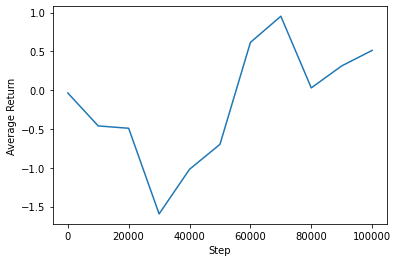

In [14]:
steps = range(0, num_iterations + 1, eval_interval)
plt.plot(steps, returns)
plt.ylabel('Average Return')
plt.xlabel('Step')
plt.ylim()

In [16]:
def embed_mp4(filename):
  """Embeds an mp4 file in the notebook."""
  video = open(filename,'rb').read()
  b64 = base64.b64encode(video)
  tag = '''
  <video width="640" height="480" controls>
    <source src="data:video/mp4;base64,{0}" type="video/mp4">
  Your browser does not support the video tag.
  </video>'''.format(b64.decode())

  return IPython.display.HTML(tag)

def create_policy_eval_video(policy, filename, num_episodes=3, fps=60):
  filename = filename + ".mp4"
  with imageio.get_writer(filename, fps=fps) as video:
    for _ in range(num_episodes):
      time_step = eval_env.reset()
      video.append_data(eval_py_env.render())
      while not time_step.is_last():
        action_step = policy.action(time_step)
        time_step = eval_env.step(action_step.action)
        video.append_data(eval_py_env.render())
  return embed_mp4(filename)


create_policy_eval_video(tf_agent.policy, "sac_minitaur")

In [17]:
create_policy_eval_video(random_policy, "random_minitaur")